In [14]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
import seaborn as sns


In [15]:
data = pd.read_csv('movie_interest_dataset.csv')

In [44]:
label_encoder = LabelEncoder()
data['Interest Level'] = label_encoder.fit_transform(data['Interest Level'])

In [30]:
encoder = OneHotEncoder(sparse=False, drop='first')
X_encoded = encoder.fit_transform(data[['Genre']])
encoded_cols = encoder.get_feature_names_out(['Genre'])
X_encoded_df = pd.DataFrame(X_encoded, columns=encoded_cols, index=data.index)

In [45]:
X_final = pd.concat([X_encoded_df, data.drop(['Genre', 'Interest Level'], axis=1)], axis=1)


In [46]:
X = X_final
y = data['Interest Level']

In [33]:
encoder = OneHotEncoder(sparse_output=False, drop='first')
X_encoded = encoder.fit_transform(X[categorical_cols])
encoded_cols = encoder.get_feature_names_out(categorical_cols)
X_encoded_df = pd.DataFrame(X_encoded, columns=encoded_cols, index=X.index)


In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


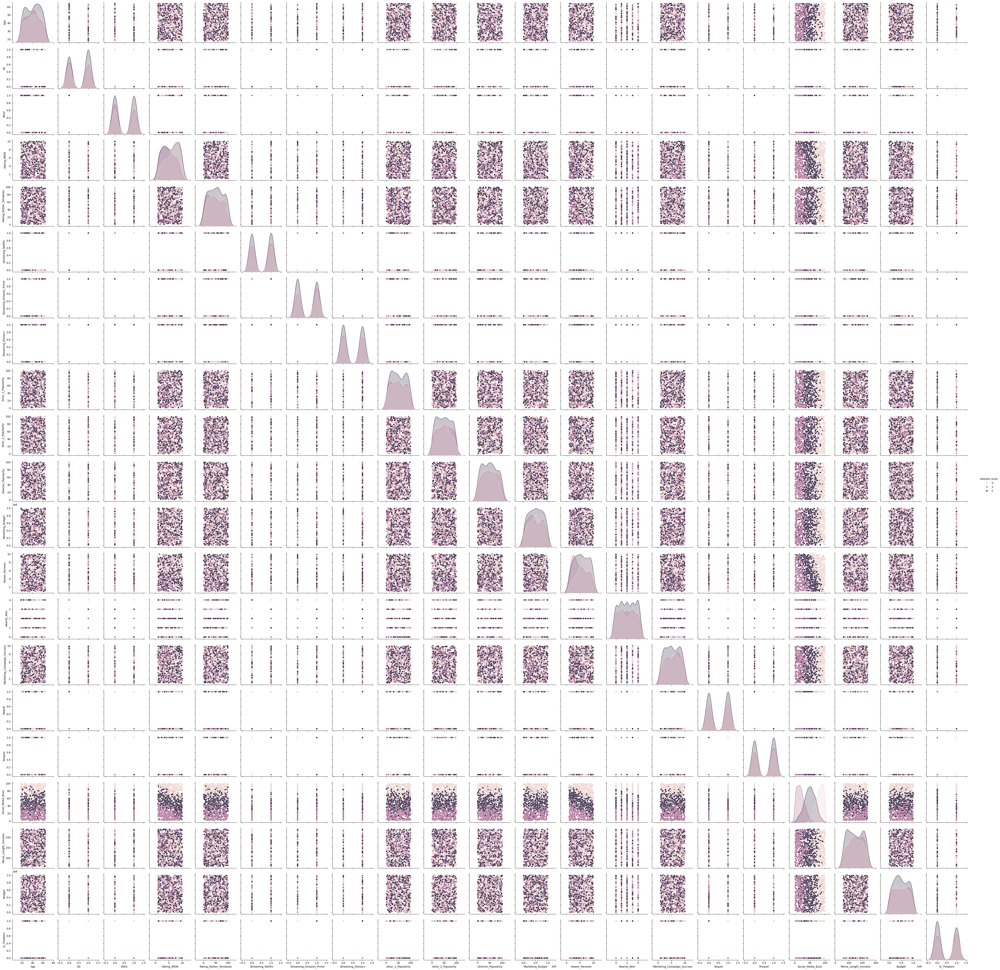

In [48]:
sns.pairplot(data.drop('Genre', axis=1), hue='Interest Level')
plt.show()

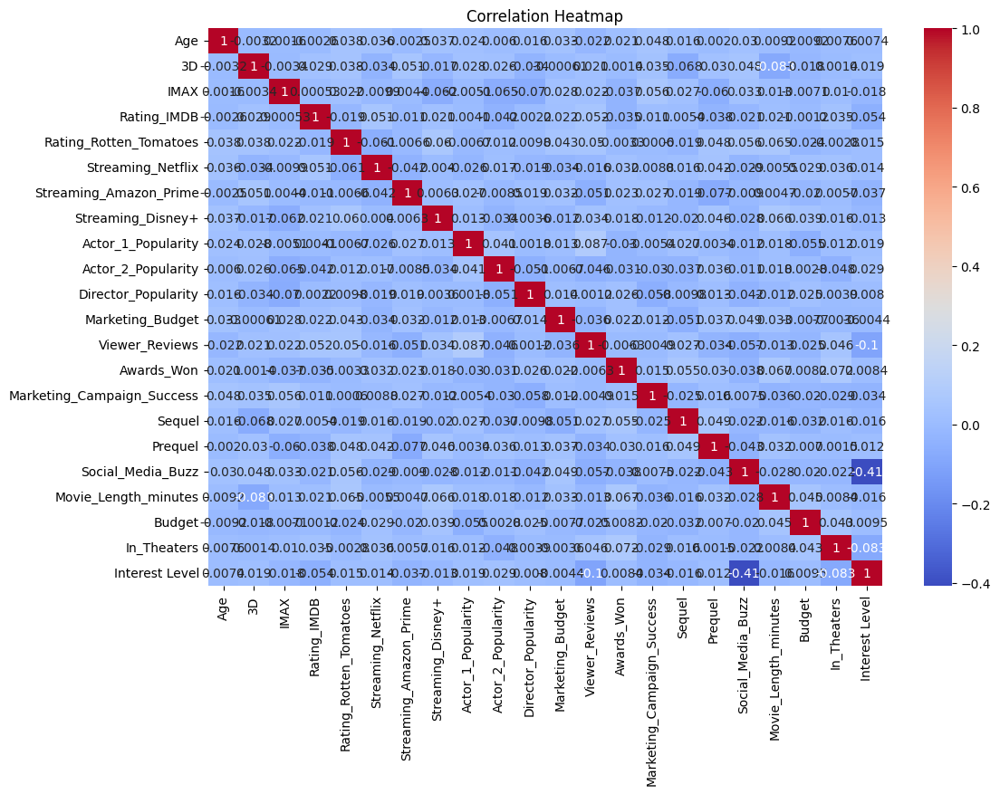

In [49]:
corr = data.drop('Genre', axis=1).corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [50]:
model = RandomForestRegressor()
model.fit(X_train, y_train)


RandomForestRegressor()

In [51]:
importances = model.feature_importances_
feature_names = X_train.columns

In [52]:
sorted_feature_indices = importances.argsort()[::-1]
sorted_features = [feature_names[i] for i in sorted_feature_indices]
sorted_importances = [importances[i] for i in sorted_feature_indices]

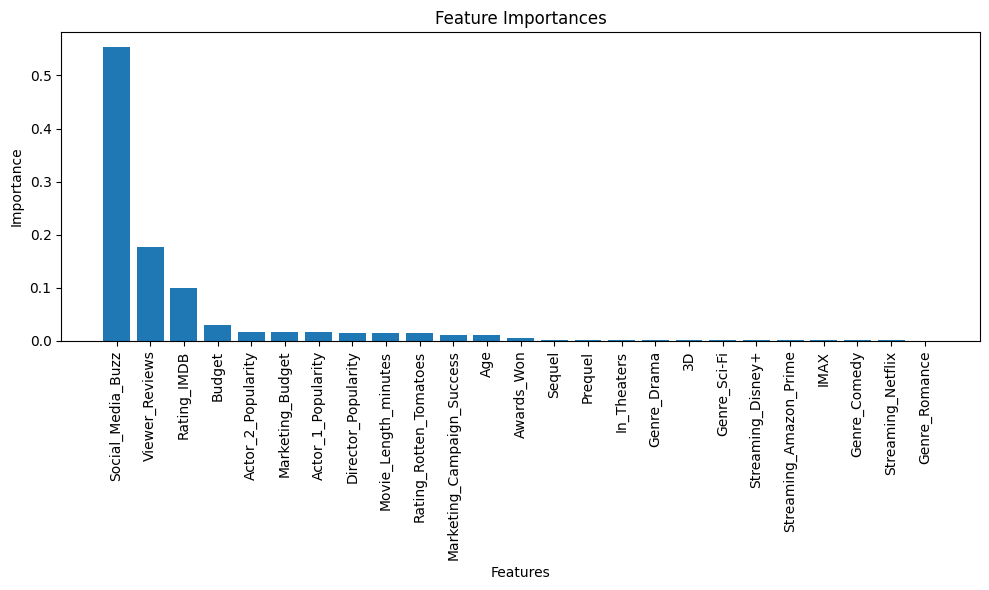

In [54]:
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.bar(sorted_features, sorted_importances)
plt.xlabel("Features")
plt.ylabel ("Importance")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Cross-Validation RMSE Scores: [0.5395797  0.44794391 0.45569933 0.49337169 0.49776877]
Mean Cross-Validation RMSE: 0.4868726797578227


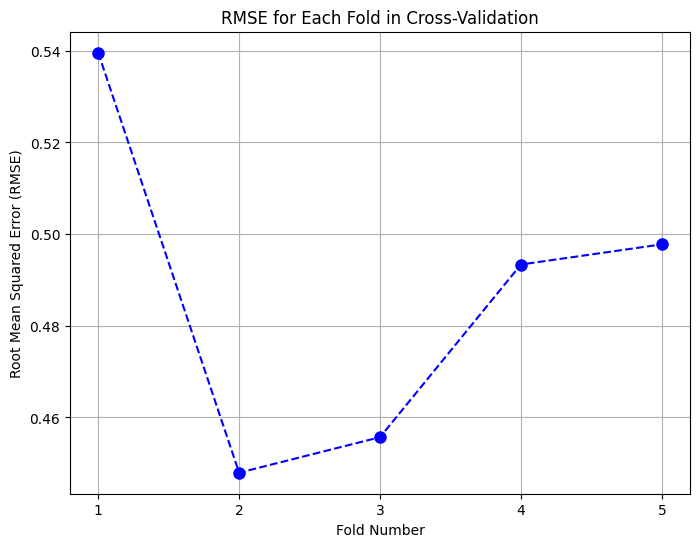

In [39]:
cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(-cv_scores)
print("Cross-Validation RMSE Scores:", cv_rmse_scores)
print("Mean Cross-Validation RMSE:", cv_rmse_scores.mean())
plt.figure(figsize=(8, 6))
plt.plot(range(1, 6), cv_rmse_scores, marker='o', linestyle='dashed', color='b', markersize=8)
plt.xlabel('Fold Number')
plt.ylabel('Root Mean Squared Error (RMSE)')
plt.title('RMSE for Each Fold in Cross-Validation')
plt.xticks(range(1, 6))
plt.grid(True)
plt.show()

In [70]:
y_pred_test = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)

Mean Squared Error: 0.267032375
Mean Absolute Error: 0.32587499999999997


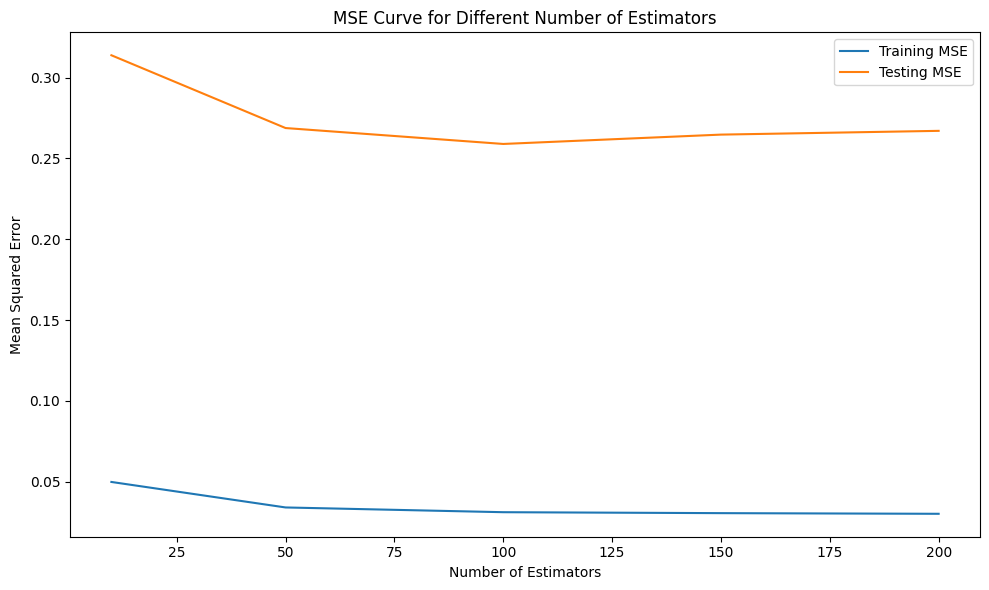

In [62]:
num_estimators = [10, 50, 100, 150, 200]
train_errors = []
test_errors = []
for n in num_estimators:
    model = RandomForestRegressor(n_estimators=n)
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)
    train_errors.append(train_error)
    test_errors.append(test_error)


plt.figure(figsize=(10, 6))
plt.plot(num_estimators, train_errors, label='Training MSE')
plt.plot(num_estimators, test_errors, label='Testing MSE')
plt.title('MSE Curve for Different Number of Estimators')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.tight_layout()
plt.show()


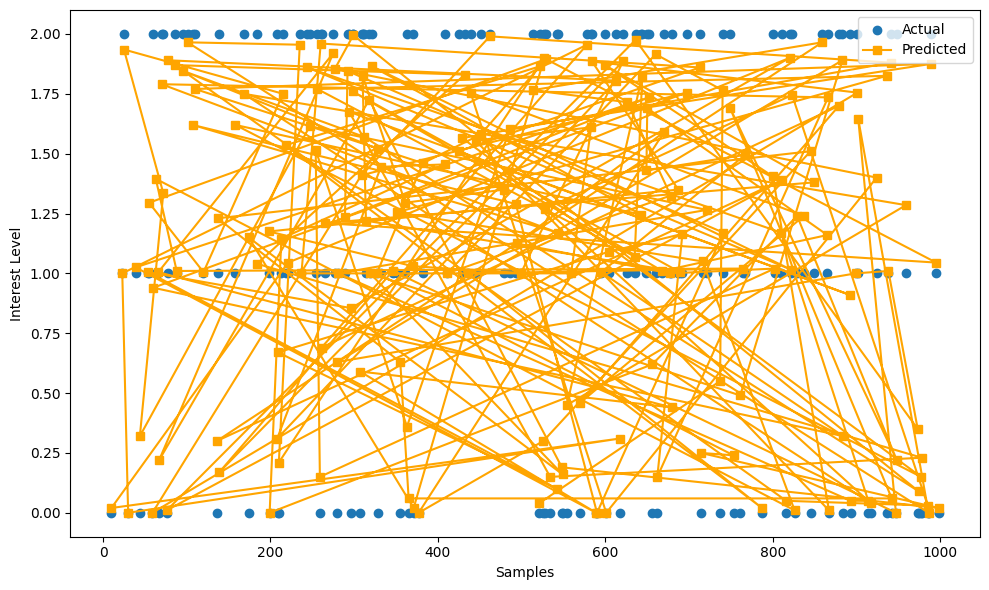

In [63]:

y_pred = model.predict(X_test)
result = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
plt.figure(figsize=(10, 6))
plt.scatter(result.index, result['Actual'], label='Actual', marker='o')
plt.plot(result.index, result['Predicted'], label='Predicted', linestyle='-', marker='s', color='orange')
plt.xlabel("Samples")
plt.ylabel("Interest Level")
plt.legend()
plt.tight_layout()
plt.show()
